# MTH3302 : Méthodes probabilistes et statistiques pour l'I.A.

Jonathan Jalbert<br/>
Professeur adjoint au Département de mathématiques et de génie industriel<br/>
Polytechnique Montréal<br/>


Le projet a été préparé par Gabriel Gobeil, associé de recherche à Polytechnique Montréal.

---
# Projet A2022 : Récolte des cerfs de Virginie


La description du projet est disponible à l'adresse suivante : https://www.kaggle.com/t/23b6d8c44f1247c78e19a6a902f804af

Ce calepin Jupyter de base permet de charger et de nettoyer les données fournies. La dernière section détaille la génération du fichier des prédictions afin de le soumettre sur Kaggle dans le bon format.

### Données

Dans un premier temps, vous devrez récupérer les données sur Kaggle. Les fichiers disponibles sont les suivants :
- recolte.csv
- permis.csv
- meteo.csv
- essence.csv
- test.csv

**Déposez ces fichiers dans un dossier nommé *data* dans le répertoire de ce calepin.**

Le fichier *recolte.csv* contient les statistiques de chasse au cerf de Viriginie. On y retrouve le nombre de cerfs mâles adultes récoltés annuellement dans certaines zones de chasse du Québec, listé selon le type d'engin utilisé.

Le fichier *permis.csv* contient des informations sur le nombre de permis de chasse aux cerfs de Virginie alloués aux résidents et non-résidents de 1999 à 2020.

Le fichier *meteo.csv* contient certaines variables météorologiques enregistrées à la station Montréal-Trudeau de 1999 à 2021 :
- Mean Temp (°C)	
- Total Rain (mm)	
- Total Snow (cm)	
- Snow on Grnd (cm)

Le fichier *essence.csv* contient des informations sur le prix de détail moyen par mois de l'essence pour Québec et Montréal de 1999 à 2021. Des renseignements additionnels sur les données sont disponibles à l'adresse suivante : https://www150.statcan.gc.ca/t1/tbl1/fr/cv.action?pid=1810000101

Le fichier *test.csv* contient les zones de chasse pour lesquels vous devez prédire le nombre de cerfs mâles adultes récoltés pour l'année 2021, peu importe l'engin de chasse utilisé. La qualité de vos prédictions sera ensuite évaluée lorsque vous les téléverserez sur Kaggle. Vos prédictions seront comparées à celles des autres équipes de la classe.

### Consignes

- Vous devez constituer une équipe de 3 à 5 personnes.
- Au moins une solution doit être proposée sur Kaggle.
- Utilisez votre identifiant d'équipe pour téléverser vos prédictions sur Kaggle.
- Un seul calepin *.ipynb* par équipe doit être remis. Ce fichier documente et illustre la procédure qui vous a permis de produire vos meilleures prédictions. Ce fichier constitue le rapport final du projet.
- Le langage Julia doit être utilisé.
- Votre démarche doit être rigoureusement justifiée (consultez la grille de correction pour vous orienter).

### Quelques conseils

Votre calepin doit permettre à une personne à l'extérieur de l'équipe de comprendre votre démarche et de reproduire vos résultats. Par exemple, une bonne façon de faire consiste à expliquer dans une cellule de texte la tâche qui est accomplie dans la cellule de code suivante. 

Je vous encourage fortement à faire une analyse exploratoire des données pour développer une meilleure expertise du problème. C'est une étape qui est toujours négligée mais qui est essentielle. C'est avec l'analyse exploratoire que vous viendra des idées d'amélioration, comme par exemple créer de nouvelles variables explicatives.

Vous pouvez utiliser directement tout ce qui se trouve dans les notes de cours sans explication et toutes les librairies utilisées dans le cours (incluant mes fonctions).

Ce calepin contient un modèle très simple de prédiction : on n'utilise qu'une seule variable explicative. Ce sera votre travail d'améliorer ces prédictions avec la méthode et les variables de votre choix.

S'il y a des données manquantes, ce sera à vous de traiter ce problème. La plupart du temps, une méthode simple d'imputation (de remplacement) des données manquantes est suffisante.

Prenez la peine de documenter succinctement les essais infructueux. Ce n'est pas nécessaire de les expliquer en détails, mais c'est important de les mentionner dans la discussion avec une raison possible de leur échec. De cette façon, une personne qui reprendra votre travail dans le futur ne perdra pas de temps à réessayer une méthode infructueuse déjà testée.

Vous pouvez aussi indiquer dans votre rapport les raisons qui vous font croire pourquoi une méthode a moins bien performée de ce qui était attendu. Vous pouvez également mentionner ce que vous auriez pu tenter si vous aviez eu plus de temps ou plus de données. L'idée est de guider l'analyste qui prendrait la relève de votre travail.

Vous êtes limités à deux soumissions par jour UTC par équipe sur Kaggle. Je vous suggère donc de bien tester vos modèles localement et de ne téléverser que vos meilleurs prédictions de la journée.

In [1]:
using CSV, DataFrames, Statistics, Dates, Gadfly, ColorSchemes, Impute, StatsBase, MLJ

# on retire l'ambiguité de la fonction transform
transform = DataFrames.transform

transform (generic function with 4 methods)

---
## 1. Chargement de données

#### Récolte annuelle de cerfs par zones de chasse selon les différents engins

In [2]:
recolte = CSV.read("data/recolte.csv", DataFrame)
first(recolte, 5)

,Année,Zone,Engin,Cerfs
,Int64,Int64,String15,Int64
1,1999,2,Arc,58
2,1999,2,Carabine,852
3,1999,2,Indéterminé,12
4,1999,3,Arc,94
5,1999,3,Carabine,1422


#### Nombre de permis de chasse alloués annuellement aux résidents et non-résidents

In [237]:
permis = CSV.read("data/permis.csv", DataFrame)
first(permis, 5)

,Année,Résidents,Résidents premier abbatage,Non-résidents,Total
,Int64,Int64,Int64?,Int64,Int64
1,1998,135409,missing,1230,136639
2,1999,131325,missing,1260,132585
3,2000,137346,missing,1463,138809
4,2001,144074,missing,1551,145625
5,2002,151154,missing,1735,152889


In [238]:
describe(permis)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Int64,Float64,Int64,Int64,Type
1,Année,2009.0,1998,2009.0,2020,0,Int64
2,Résidents,1.46421e5,126315,143829.0,171684,0,Int64
3,Résidents premier abbatage,9081.92,8369,8951.0,9816,11,"Union{Missing, Int64}"
4,Non-résidents,1266.65,691,1230.0,1830,0,Int64
5,Total,1.52426e5,132585,152889.0,173330,0,Int64


#### Moyenne mensuelle du prix de détail de l'essence en cents pour Québec et Montréal

In [239]:
essence = CSV.read("data/essence.csv", DataFrame)
first(essence, 5)

,Mois,Québec,Montréal
,Date,Float64,Float64
1,1997-04-01,60.1,60.3
2,1997-05-01,60.7,60.5
3,1997-06-01,59.4,61.5
4,1997-07-01,57.9,59.7
5,1997-08-01,62.8,64.0


In [240]:
describe(essence)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,DataType
1,Mois,,1997-04-01,2009-12-01,2022-08-01,0,Date
2,Québec,103.841,51.8,105.7,219.7,0,Float64
3,Montréal,105.648,52.2,107.4,216.5,0,Float64


#### Données météorologiques quotidiennes à Montréal-Trudeau entre 1999 et 2021

In [241]:
meteo = CSV.read("data/meteo.csv", DataFrame)
first(meteo, 5)

,Date/Time,Mean Temp (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm)
,Date,Float64?,Float64?,Float64?,Int64?
1,1999-01-01,-20.5,0.0,1.0,2
2,1999-01-02,-19.2,0.0,0.0,2
3,1999-01-03,-8.5,1.2,11.4,7
4,1999-01-04,-9.4,0.0,0.0,8
5,1999-01-05,-14.3,0.0,0.0,8


In [242]:
describe(meteo)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,Type
1,Date/Time,,1999-01-01,2009-12-31,2021-12-31,0,Date
2,Mean Temp (°C),7.47565,-26.5,8.1,30.1,18,"Union{Missing, Float64}"
3,Total Rain (mm),2.29677,0.0,0.0,73.8,26,"Union{Missing, Float64}"
4,Total Snow (cm),0.573052,0.0,0.0,45.6,13,"Union{Missing, Float64}"
5,Snow on Grnd (cm),4.12935,0,0.0,51,2006,"Union{Missing, Int64}"


En regardant le fichier csv, on se rend compte que les nombreuses données manquantes pour Snwo on Grnd correspondent majoritairement à des dates en dehors des périodes hivernales à partir de 2011. On devrait pouvoir les remplacer par 0 sans créer de problème. Les autres données manquantes peuvent être définies par interpolation.

In [243]:
replace!(meteo[!,"Snow on Grnd (cm)"], missing => 0.0);
meteo = Impute.interp(meteo) |> Impute.locf() |> Impute.nocb();

---
## 2. Analyse exploratoire

Cette section consitue une analyse exploratoire superficielle permettant de se familiariser avec les données. C'est une analyse exploratoire sommaire. Je vous encourage fortement à poursuivre cette analyse.

#### 2.1 Quantité de cerfs récoltés annuellement pour tous les engins de chasse

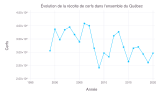

In [244]:
set_default_plot_size(16cm, 10cm)
df = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs)
plot(df, x=:Année, y=:Cerfs, Geom.line, Geom.point, Guide.title("Évolution de la récolte de cerfs dans l'ensemble du Québec"))

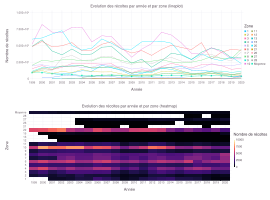

In [245]:
set_default_plot_size(27cm, 20cm)

df_plot = combine(groupby(recolte, [:Zone, :Année]), :Cerfs => sum => :Cerfs)
moyenne_df = combine(groupby(recolte, :Année), :Cerfs => mean => :Cerfs)
moyenne_df.Zone .= "Moyenne"

lineplot = plot(df_plot, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Cerfs,
    color=:Zone, Scale.color_discrete, 
    Geom.line,
    Guide.ylabel("Nombre de récoltes"), Guide.title("Evolution des récoltes par année et par zone (lineplot)"),
    layer(moyenne_df, x=:Année, y=:Cerfs, Geom.line, Geom.point, color=["Moyenne"]),
)

heatmap = plot(df_plot, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Zone, Scale.y_discrete,
    color=:Cerfs, Guide.colorkey(title="Nombre de récoltes"), Scale.ContinuousColorScale(palette -> get(ColorSchemes.magma, palette)),
    Geom.rectbin,
    Guide.title("Evolution des récoltes par année et par zone (heatmap)"),
    layer(moyenne_df, x=:Année, y=:Zone, Geom.rectbin, color=:Cerfs),
)

vstack(lineplot, heatmap)

#### 2.2 Analyse des permis vendus

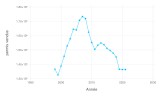

In [229]:
set_default_plot_size(16cm, 10cm)
plot(permis, x=:Année, y=:Total, Geom.line, Geom.point,
    Guide.ylabel("permis vendus"))

Corrélation de Pearson entre les cerfs abbatus et les permis vendus:0.3737258394438486


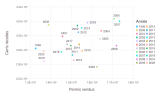

In [246]:
set_default_plot_size(16cm, 10cm)
df2 = innerjoin(combine(groupby(recolte, [:Année]), :Cerfs => sum => :Cerfs), permis, on = :Année)
println("Corrélation de Pearson entre les cerfs abbatus et les permis vendus:",cor(df2.Total, df2.Cerfs))
plot(df2, 
    x=:Total,
    y=:Cerfs,
    label=["$(i)" for i in unique(df.Année)],
    Geom.label,
    Geom.point,
    color=:Année, Scale.color_discrete, 
    Guide.xlabel("Permis vendus"),
    Guide.ylabel("Cerfs récoltés")
)

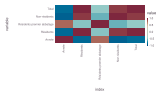

In [247]:
correlation_matrix = cor(Matrix(dropmissing(permis)))
df_corr = DataFrame(correlation_matrix, names(permis))
df_corr.index = names(permis);
plot(stack(df_corr), x=:index, y=:variable, color=:value, Geom.rectbin)

On remarque une légère corrélation positive entre le nombre de permis vendus et le nombre de cerfs récoltés. Remarquons tout de même qu'on ne connaît pas le nombre de permis vendus pour 2021, l'année à prédire. Comme il semblerait que les permis soient à renouveller chaque année, utiliser le nombre de permis de l'année précédente pour prédire le nombre de cerfs récoltés d'une année ne semble pas un choix logique, bien que possible. Comme nous voyons un plateau entre 2019 et 2020, on va supposer que ce plateau se poursuit en 2021 et on et on va dupliquer les valeurs de l'année 2020.

Enfin, puisque les variables Total, Non-résidents et Résidents sont fortement corrélées, on ne va garder que la variable Total. La variable "résidents remier abbatage" aurait pu être intéressante mais il y a trop de valeurs manquantes pour que ce soit utilisé.

In [248]:
permis_2021 = permis[permis.Année .== 2020, :];
permis_2021.Année .= 2021
append!(permis, permis_2021);

In [249]:
permis = select(permis, [:Année, :Total]);
first(permis,3)

,Année,Total
,Int64,Int64
1,1998,136639
2,1999,132585
3,2000,138809


#### 2.4 Analyse de la météo

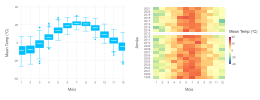

In [250]:
set_default_plot_size(26cm, 10cm)
df = copy(meteo)
df.Année .= DataFrames.transform(df, "Date/Time" => x->year.(x))[!,"Date/Time_function"]
df.Mois  .= transform(df, "Date/Time" => x->month.(x))[!,"Date/Time_function"]
df.Date  .= transform(df, "Date/Time" => x->Date.(2000,month.(x),day.(x)))[!,"Date/Time_function"]

rows = []

# la ligne suivante permet d'afficher pour chaque colonne, neanmoins cela est trop gourmant
# a l'affichage pour le navigateur. Nous affichons alors uniquement pour la température
# for col in names(select(df, Not(["Date/Time", "Année", "Mois", "Date"])))
for col in ["Mean Temp (°C)"]
    df = filter(col .=> c -> !ismissing(c) , df)
    lineplot = plot(df, x=:Mois, Guide.xticks(ticks=[1:12;]), y=col, Geom.boxplot)
    heatmap  = plot(df, 
        x=:Mois, Guide.xticks(ticks=[1:12;]),
        y=:Année, Guide.yticks(ticks=[1999:2021;]), 
        color=col,
        Scale.ContinuousColorScale(palette -> get(ColorSchemes.Spectral, 1-palette), 
            minvalue=min(df[!,col]...),
            maxvalue=max(df[!,col]...)),
        Geom.rectbin)
    push!(rows, hstack(lineplot, heatmap))
end
vstack(rows...)

On remarque quelques variations dans les températures entre les années, notament en hiver où certaines années ont été bien plus froide que d'autres. Aussi, les données en température de l'année 2013 sont manquantes. Plutôt que faire une interpolation dessus, on va plutôt ignorer l'année 2013 dans nos différents modèles utilisant les données météorologiques.

In [251]:
df = copy(meteo)
df.Année .= DataFrames.transform(df, "Date/Time" => x->year.(x))[!,"Date/Time_function"]
df[!,"Année"] .= DataFrames.transform(df, "Date/Time" => x->year.(x))[!,"Date/Time_function"];
df[!,"Mois"]  .= transform(df, "Date/Time" => x->month.(x))[!,"Date/Time_function"];
df_meteo = combine(groupby(df, [:Année, :Mois]), "Mean Temp (°C)" => mean => :Mean_Temp);
df_recolte = combine(groupby(recolte, :Année), :Cerfs => sum => :Cerfs);

In [252]:
col_names = [:Annee, :Cerfs, :_1, :_2, :_3, :_4, :_5, :_6, :_7, :_8, :_9, :_10, :_11, :_12,
    :p1, :p2, :p3, :p4, :p5, :p6, :p7, :p8, :p9, :p10, :p11, :p12] # needs to be a vector Symbols
col_types = [Float64 for i in 1:26]# Create a NamedTuple (A=Int64[], ....) by doing
named_tuple = (; zip(col_names, type[] for type in col_types )...);
df5 = DataFrame(named_tuple) # 0×2 DataFrame
for annee in unique(df_meteo.Année)
    if annee ∉ [1999, 2014, 2021]
        row = Float64[]
        append!(row,annee)
        append!(row, df_recolte[df_recolte.Année.==annee,:].Cerfs[1])
        for mois in unique(df_meteo.Mois)
            append!(row, df_meteo[df_meteo.Année.==annee .&& df_meteo.Mois.==mois, :].Mean_Temp)
            append!(row, df_meteo[df_meteo.Année.==annee-1 .&& df_meteo.Mois.==mois, :].Mean_Temp)
        end
        push!(df5, row)
    end
end
first(df5, 5)

,Annee,Cerfs,_1,_2,_3,_4,_5,_6,_7
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,2000.0,38737.0,-10.0774,-9.22258,-7.01379,-5.11071,1.60323,-1.27097,5.19167
2,2001.0,34751.0,-8.94516,-10.0774,-8.62857,-7.01379,-3.32581,1.60323,6.45333
3,2002.0,38501.0,-4.44194,-8.94516,-4.975,-8.62857,-1.87742,-3.32581,6.88667
4,2003.0,39544.0,-12.5903,-4.44194,-10.7714,-4.975,-3.77097,-1.87742,4.23
5,2004.0,36699.0,-15.1097,-12.5903,-7.88966,-10.7714,-0.309677,-3.77097,6.03


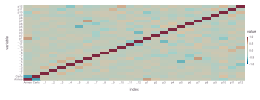

In [253]:
correlation_matrix = cor(Matrix(dropmissing(df5)))
df_corr = DataFrame(correlation_matrix, names(df5))
df_corr.index = names(df5);
plot(stack(df_corr), x=:index, y=:variable, color=:value, Geom.rectbin)

On remarque que les mois sont faiblement corrélés entre eux, prendre une moyenne des températures sur toute l'année risque de ne pas être très intéressant. De manière générale, on remarque que les températures moyennes des mois de l'année en cours et de l'année précédente sont assez faiblement corrélés à la récolte de l'année. Les mois dont les températures moyennes sont les plus corrélés à la récolte de cerfs sont octobre de l'année précédente (positif, +0.446), janvier de l'année précédente (-0.298) et janvier de l'année présente (+0.215).

Nous n'allons pas étendre cette analyse assez fastidieuse aux autres données météorologiques. A la place, nous allons plutôt commencer par considérer toutes les varaibles possibles puis nous éliminerons celles avec une corrélation trop faible par rapport à la récolte de cerfs.

#### 2.4 Analyse de l'essence

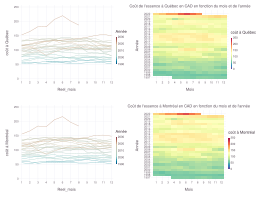

In [254]:
set_default_plot_size(26cm, 20cm)
df = copy(essence)
df.Année .= DataFrames.transform(df, "Mois" => x->year.(x))[!,"Mois_function"]
df.Reel_mois  .= transform(df, "Mois" => x->month.(x))[!,"Mois_function"]
df.Date  .= transform(df, "Mois" => x->Date.(2000,month.(x),day.(x)))[!,"Mois_function"]
rename!(df,:Québec => :"coût à Québec");
rename!(df,:Montréal => :"coût à Montréal");

rows = []
for col in names(select(df, Not(["Mois", "Année", "Reel_mois", "Date"])))
    df = filter(col .=> c -> !ismissing(c) , df)
    if col=="coût à Québec"
        city = "Québec"
    else
        city = "Montréal"
    end
    lineplot = plot(df, x=:Reel_mois, Guide.xticks(ticks=[1:12;]), y=col, color=:Année, Geom.line)
    heatmap  = plot(df, 
        x=:Reel_mois, Guide.xticks(ticks=[1:12;]),
        y=:Année, Guide.yticks(ticks=[1997:2022;]), 
        color=col,
        Scale.ContinuousColorScale(palette -> get(ColorSchemes.Spectral, 1-palette), 
            minvalue=min(df[!,col]...),
            maxvalue=max(df[!,col]...)),
        Guide.xlabel("Mois"),
        Guide.title("Coût de l'essence à "*city*" en CAD en fonction du mois et de l'année"),
        Geom.rectbin)
    push!(rows, hstack(lineplot, heatmap))
end
vstack(rows...)

Nous remarquons une augmentation plus ou moins regulière du prix de l'essence d'année en année. Les prix à Montréal et à Québec sont fortement coréllés. 
L'année `2022` se distingue amplement mais cette dernière n'est pas à prendre en compte pour la prédiction désirée qui est sur l'année 2021.

In [255]:
df_essence = copy(essence)
df_essence.Année .= DataFrames.transform(df_essence, "Mois" => x->year.(x))[!,"Mois_function"]
df_essence.Reel_mois  .= transform(df_essence, "Mois" => x->month.(x))[!,"Mois_function"]
df_essence.Date  .= transform(df_essence, "Mois" => x->Date.(2000,month.(x),day.(x)))[!,"Mois_function"];

col_names = [:Annee, :Cerfs, :_1, :_2, :_3, :_4, :_5, :_6, :_7, :_8, :_9, :_10, :_11, :_12,
    :p1, :p2, :p3, :p4, :p5, :p6, :p7, :p8, :p9, :p10, :p11, :p12] # needs to be a vector Symbols
col_types = [Float64 for i in 1:26]# Create a NamedTuple (A=Int64[], ....) by doing
named_tuple = (; zip(col_names, type[] for type in col_types )...);

df5 = DataFrame(named_tuple) 
for annee in unique(df_essence.Année)
    if annee ∉ [1997, 1998, 1999, 2021, 2022] # on a des année inutiles dans le csv de l'essence
        row = Float64[]
        append!(row,annee)
        append!(row, df_recolte[df_recolte.Année.==annee,:].Cerfs[1])
        for mois in unique(df_essence.Reel_mois)
            append!(row, df_essence[df_essence.Année.==annee .&& df_essence.Reel_mois.==mois, :].Montréal)
            append!(row, df_essence[df_essence.Année.==annee-1 .&& df_essence.Reel_mois.==mois, :].Montréal)
        end
        push!(df5, row)
    end
end
first(df5, 5)

,Annee,Cerfs,_1,_2,_3,_4,_5,_6,_7
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,2000.0,38737.0,71.7,61.2,75.0,61.8,81.7,60.6,79.4
2,2001.0,34751.0,81.3,71.7,84.5,75.0,75.5,81.7,69.0
3,2002.0,38501.0,73.0,81.3,69.0,84.5,68.2,75.5,73.5
4,2003.0,39544.0,75.0,73.0,70.9,69.0,72.8,68.2,74.4
5,2004.0,36699.0,82.3,75.0,95.9,70.9,90.3,72.8,87.2


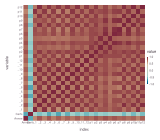

In [258]:
set_default_plot_size(16cm, 14cm)
correlation_matrix = cor(Matrix(dropmissing(df5)))
df_corr = DataFrame(correlation_matrix, names(df5))
df_corr.index = names(df5);
plot(stack(df_corr), x=:index, y=:variable, color=:value, Geom.rectbin)

On remarque que les prix de l'essence sur les différents mois sont très fortement corrélés, et que le nombre de cerfs récoltés est négativement corrélé au prix de l'essence (il n'y a pas forcément une cause et un effet, juste une corrélation). On remarque tout de même que plus on remonte loin dans le temps (:p1 est le mois le plus ancien, c'est janvier de l'année précédente), moins cette corrélation est importante. Il pourrait être bon de considérer uniquement les moix 4 et 8 de l'année en cours et éventuellement le mois 10 de l'année précédente. 

## 3 Création d'un dataframe regroupant un maximum de données

In [259]:
df_recolte = combine(groupby(recolte, [:Zone, :Année]), :Cerfs => sum => :Cerfs);

#### 3.1 Création de la partie "essence" du dataframe

Comme dit plus haut, on ne va prendre pour chaque année les valeurs de certains mois : avril et aout de l'année en cours et octobre de l'année précédente. On va considérer le prix de l'essence dans toutes les zones égal au prix de Montréal.

In [295]:
col_names = [:Année, :Zone, :essence_4, :esence_8, :essence_p10] # needs to be a vector Symbols
col_types = [Float64 for i in 1:5] 
named_tuple = (; zip(col_names, type[] for type in col_types )...);

mois_courante = [4, 8]
mois_precedente = [10]

cp_essence = DataFrame(named_tuple) 
for annee in unique(df_essence.Année)
    if annee ∉ [1997, 1998, 2022] # on a des année inutiles dans le csv de l'essence
        for zone in unique(df_recolte.Zone)
            row = Float64[]
            append!(row,annee)
            append!(row,zone)
            cerfs = df_recolte[df_recolte.Année.==annee .&& df_recolte.Zone.==zone,:].Cerfs
            """
            if(length(cerfs)>0)
                append!(row, cerfs[1])
            else
                append!(row, 0) # push zero ou ne rien faire? Plus simple de push 0 puis d'enlever les lignes ou on a 0 quand on crée la matrice
            end
            """
            for mois in mois_courante
                append!(row, df_essence[df_essence.Année.==annee .&& df_essence.Reel_mois.==mois, :].Montréal)
            end
            for mois in mois_precedente
                append!(row, df_essence[df_essence.Année.==annee-1 .&& df_essence.Reel_mois.==mois, :].Montréal)
            end
            push!(cp_essence, row)
        end
    end
end
first(cp_essence, 5)

,Année,Zone,essence_4,esence_8,essence_p10
,Float64,Float64,Float64,Float64,Float64
1,1999.0,1.0,61.2,67.3,56.3
2,1999.0,2.0,61.2,67.3,56.3
3,1999.0,3.0,61.2,67.3,56.3
4,1999.0,4.0,61.2,67.3,56.3
5,1999.0,5.0,61.2,67.3,56.3


#### 3.2 Création de la partie "météo" du dataframe

C'est la partie la plus difficile du traitement des données d'entrée. On va ici garder un maximum de variables possibles en regardant toutes les données météorologiques sur l'année en cours mais aussi sur les deux années précédentes, regroupées par mois.

In [283]:
meteo_par_année = combine(groupby(transform(meteo, "Date/Time" => x->year.(x)), "Date/Time_function"), 
    ["Mean Temp (°C)" => mean => :Moyenne_température,
     "Total Snow (cm)" => sum => :Cumul_neige,
     "Total Rain (mm)" => sum => :Cumul_pluie,
     "Snow on Grnd (cm)" => mean => :Moyenne_neige_au_sol,
     ]
)
rename!(meteo_par_année,"Date/Time_function" => :Année)

colnames = ["Année"]
for mois in 1:12
    for col in names(select(meteo, Not("Date/Time")))
        for value in ["Moyenne", "Min", "Max", "Somme"]
            push!(colnames, "meteo_$(value)_$(col)_m$(mois)")
            push!(colnames, "meteo_p1_$(value)_$(col)_m$(mois)")
            push!(colnames, "meteo_p2_$(value)_$(col)_m$(mois)")
        end
    end
end

années_considérées = vcat([i for i in 2001:2012], [i for i in 2016:2021]); # rappel: on a un trou en 2013

meteo_decoupee_par_mois = DataFrame(ones(length(unique(meteo_par_année.Année)), length(colnames)), colnames)
meteo_decoupee_par_mois.Année = unique(meteo_par_année.Année)
for année in années_considérées
    meteo_de_l_année = meteo[transform(meteo, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année, :]
    meteo_an_moins1 = meteo[transform(meteo, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année-1, :]
    meteo_an_moins2 = meteo[transform(meteo, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année-2, :]
    for mois in 1:12
        metéo_du_mois = meteo_de_l_année[transform(meteo_de_l_année, "Date/Time" => x->month.(x))[!,"Date/Time_function"] .== mois, :]
        metéo_mois_an_moins1 = meteo_an_moins1[transform(meteo_an_moins1, "Date/Time" => x->month.(x))[!,"Date/Time_function"] .== mois, :]
        metéo_mois_an_moins2 = meteo_an_moins2[transform(meteo_an_moins2, "Date/Time" => x->month.(x))[!,"Date/Time_function"] .== mois, :]
        for c in names(select(metéo_du_mois, Not("Date/Time")))
            # pour les mois de l'année en cours:
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Moyenne_$(c)_m$(mois)"] .= mean(metéo_du_mois[!,c])
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Min_$(c)_m$(mois)"]  .= min(metéo_du_mois[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Max_$(c)_m$(mois)"]  .= max(metéo_du_mois[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_Somme_$(c)_m$(mois)"]  .= sum(metéo_du_mois[!,c])
            # pour les mois de l'année précédente:
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Moyenne_$(c)_m$(mois)"] .= mean(metéo_mois_an_moins1[!,c])
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Min_$(c)_m$(mois)"]  .= min(metéo_mois_an_moins1[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Max_$(c)_m$(mois)"]  .= max(metéo_mois_an_moins1[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p1_Somme_$(c)_m$(mois)"]  .= sum(metéo_mois_an_moins1[!,c])
            # pour les mois d'il y a 2 ans
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Moyenne_$(c)_m$(mois)"] .= mean(metéo_mois_an_moins2[!,c])
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Min_$(c)_m$(mois)"]  .= min(metéo_mois_an_moins2[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Max_$(c)_m$(mois)"]  .= max(metéo_mois_an_moins2[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"meteo_p2_Somme_$(c)_m$(mois)"]  .= sum(metéo_mois_an_moins2[!,c])
        
        end
    end
end

meteo_par_année = innerjoin(meteo_par_année, meteo_decoupee_par_mois, on=:Année)
first(meteo_par_année, 5)

,Année,Moyenne_température,Cumul_neige,Cumul_pluie,Moyenne_neige_au_sol,meteo_Moyenne_Mean Temp (°C)_m1
,Int64,Float64,Float64,Float64,Float64,Float64
1,1999,8.26562,171.7,769.1,2.08219,1.0
2,2000,6.42842,296.9,677.8,2.46995,1.0
3,2001,8.01671,225.5,536.9,7.70685,-8.94516
4,2002,7.55123,205.7,595.8,1.68767,-4.44194
5,2003,6.43589,181.7,929.9,2.56164,-12.5903


#### 3.3 Jointure des dataframes

,Année,Zone,Cerfs
,Int64,Int64,Int64
1,2021,1,0
2,2021,2,0
3,2021,3,0
4,2021,4,0
5,2021,5,0
6,2021,6,0
7,2021,7,0
8,2021,8,0
9,2021,9,0


In [384]:
# On créée un dataframe sur les récoltes de l'année 2021 juste pour garder cette année pendant les jointures
a_predire = DataFrame(Année=fill(2021,length(to_predict.Zone)), Zone=to_predict.Zone, Cerfs=fill(0,length(to_predict.Zone)))

dataset = leftjoin(vcat(df_recolte, a_predire), meteo_par_année, on = :Année)
dataset = leftjoin(dataset, cp_essence, on = [:Année, :Zone])
dataset = leftjoin(dataset, permis, on = :Année);
first(dataset, 5)

,Zone,Année,Cerfs,Moyenne_température,Cumul_neige,Cumul_pluie,Moyenne_neige_au_sol
,Int64,Int64,Int64,Float64?,Float64?,Float64?,Float64?
1,2,1999,922,8.26562,171.7,769.1,2.08219
2,3,1999,1519,8.26562,171.7,769.1,2.08219
3,4,1999,4890,8.26562,171.7,769.1,2.08219
4,5,1999,2014,8.26562,171.7,769.1,2.08219
5,6,1999,4846,8.26562,171.7,769.1,2.08219


In [385]:
describe(dataset)

,variable,mean,min,median,max,nmissing
,Symbol,Float64,Real,Float64,Real,Int64
1,Zone,10.5052,1,9.0,28,0
2,Année,2010.54,1999,2011.0,2021,0
3,Cerfs,1896.84,0,1395.5,8204,0
4,Moyenne_température,7.50264,6.24918,7.46301,8.66,17
5,Cumul_neige,209.24,122.3,192.4,342.2,17
6,Cumul_pluie,848.386,536.9,843.5,1225.2,17
7,Moyenne_neige_au_sol,3.09882,1.65301,2.71507,7.70685,17
8,meteo_Moyenne_Mean Temp (°C)_m1,-6.86837,-15.1097,-6.74516,1.0,17
9,meteo_p1_Moyenne_Mean Temp (°C)_m1,-7.2871,-15.1097,-7.01935,1.0,17


#### 3.4 Création d'une fenêtre glissante permettant de connaitre les récoltes des années précédentes + quelques autres données des années précédentes

NB: exécuter une seule cellule parmis les 2 suivantes. La première ne fait pas de différence entre les zones alors que la seconde si

In [386]:
deltas = [1,2]
colnames = ["Année"] #, "Zone"
df_recolte_agrege = combine(groupby(df_recolte, :Année), :Cerfs => sum => :Cerfs);
[push!(colnames, "recolte_Cerfs_année_delta_$(i)") for i in deltas]
[push!(colnames, "Total_permis_delta_$(i)") for i in deltas]

années_considérées = vcat([i for i in 2000:2012], [i for i in 2016:2021]); # rappel: on a un trou en 2013


fenetre_glissante_cerfs = DataFrame(ones(length(années_considérées),length(colnames)), colnames)
fenetre_glissante_cerfs.Année = années_considérées
for row in eachrow(fenetre_glissante_cerfs)
    année = row.Année
    if année in années_considérées 
        for delta in deltas
            colname = "recolte_Cerfs_année_delta_$(delta)"
            cerfs_année_delta = dataset[dataset.Année .== année-delta, :Cerfs]

            if length(cerfs_année_delta) > 0
                row[colname] = cerfs_année_delta[1]
            else #normalement ça n'arrive jamais ce else
                row[colname] = mean(dataset[!, :Cerfs])
            end

            colname = "Total_permis_delta_$(delta)"
            total_année_delta = dataset[dataset.Année .== année-delta, :Total]
            if length(total_année_delta) > 0
                row[colname] = total_année_delta[1]
            else #normalement ça n'arrive jamais ce else
                row[colname] = mean(dataset[!, :Total])
            end
        end
    end
end
dataset3 = leftjoin(dataset, fenetre_glissante_cerfs, on = :Année);

In [492]:
deltas = [1,2,3]
colnames = ["Année"] #, "Zone"
for zone in unique(dataset.Zone)
    [push!(colnames, "recolte_Cerfs_année_delta_$(i)_zone_$(zone)") for i in deltas]
end

années_considérées = vcat([i for i in 2000:2012], [i for i in 2016:2021]); # rappel: on a un trou en 2013

[push!(colnames, "Total_permis_delta_$(i)") for i in deltas]

fenetre_glissante_cerfs = DataFrame(ones(length(années_considérées),length(colnames)), colnames)
fenetre_glissante_cerfs.Année = années_considérées
for row in eachrow(fenetre_glissante_cerfs)
    année = row.Année
    for delta in deltas
        for zone in unique(dataset.Zone)
            colname = "recolte_Cerfs_année_delta_$(delta)_zone_$(zone)"
            cerfs_année_delta = dataset[dataset.Année .== année-delta .&& dataset.Zone .== zone, :Cerfs]

            if length(cerfs_année_delta) > 0
                row[colname] = cerfs_année_delta[1]
            else
                row[colname] = mean(dataset[dataset.Zone .== zone, :Cerfs])
            end
            
            colname = "Total_permis_delta_$(delta)"
            total_année_delta = dataset[dataset.Année .== année-delta, :Total]
            if length(total_année_delta) > 0
                row[colname] = total_année_delta[1]
            else
                row[colname] = mean(dataset[!, :Total])
            end
        end
    end
end
dataset3 = leftjoin(dataset, fenetre_glissante_cerfs, on = :Année);

In [387]:
dataset4 = dataset3[dataset3.Année .<2013 .|| dataset3.Année .>2015,: ];
dataset4 = dataset4[dataset4.Année.>1999,:];

#### 3.5 Suppression des colonnes avec une variance nulle

In [388]:
function remove_null_variance_columns(df::DataFrame)
    cleaned_df = DataFrame()
    for col in names(df)
        s = std(df[!,col])
        if(s != 0)
            cleaned_df[!,col] = df[!,col]
        end
    end
    return cleaned_df
end

dataset5 = remove_null_variance_columns(dataset4);

In [389]:
describe(dataset5)

,variable,mean,min,median,max,nmissing
,Symbol,Float64,Real,Float64,Real,Int64
1,Zone,10.644,1,9.0,28,0
2,Année,2010.4,2000,2009.0,2021,0
3,Cerfs,1862.69,0,1366.0,8204,0
4,Moyenne_température,7.52809,6.24918,7.55123,8.66,0
5,Cumul_neige,212.735,122.3,194.0,342.2,0
6,Cumul_pluie,848.409,536.9,812.4,1225.2,0
7,Moyenne_neige_au_sol,3.14944,1.65301,2.70685,7.70685,0
8,meteo_Moyenne_Mean Temp (°C)_m1,-7.94023,-15.1097,-7.01935,1.0,0
9,meteo_p1_Moyenne_Mean Temp (°C)_m1,-8.41599,-15.1097,-8.94516,1.0,0


#### 3.6 Analyse de la covariance

In [392]:
function get_correlation_matrix(df::DataFrame)
    correlation_matrix = cor(Matrix(df))
    (n,m) = size(correlation_matrix)
    df_corr = DataFrame(abs.(correlation_matrix), names(df))
    df_corr.index = names(df)
    return df_corr
end;

In [393]:
df_corr = get_correlation_matrix(remove_null_variance_columns(dataset5[dataset5.Zone .== 1, :]))
df_corr.Cerfs = abs.(df_corr.Cerfs)
first(sort(df_corr, :Cerfs, rev=true)[2:end, [:Cerfs, :index]], 20)

,Cerfs,index
,Float64,String
1,0.740397,Total
2,0.659344,recolte_Cerfs_année_delta_1
3,0.634505,meteo_p1_Max_Total Rain (mm)_m8
4,0.630785,meteo_p1_Max_Snow on Grnd (cm)_m2
5,0.590551,meteo_p1_Moyenne_Total Snow (cm)_m1
6,0.590551,meteo_p1_Somme_Total Snow (cm)_m1
7,0.58139,meteo_Moyenne_Snow on Grnd (cm)_m2
8,0.580482,Total_permis_delta_1
9,0.578477,meteo_Somme_Snow on Grnd (cm)_m2


#### 3.7 Retrait des variables hautement corrélées

In [432]:
# Un corr_threshold <= 0 signifie que l'on ne retire pas de variables
function retirer_variables_correlees_zone(df, zone, corr_threshold)
    df_corr = get_correlation_matrix(remove_null_variance_columns(df[df.Zone .== zone, :]))
    variables_to_drop = []
    variables_to_keep = ["Année", "Cerfs", "Zone"]
    for name in names(df_corr)
        if name != "index"
            df_corr[:, name] .= abs.(df_corr[:, name])
        end
    end
    for i in 1:size(df_corr)[1]
       for j in i+1:size(df_corr)[1]
            #println(df_corr[j, :index])
            if !(df_corr[i, :index]=="Cerfs" || df_corr[j, :index]=="Cerfs")
                if df_corr[i, j] > corr_threshold
                    if df_corr[i, "Cerfs"] < df_corr[j, "Cerfs"] # on supprime la variable avec la plus faible corrélation avec cerfs
                        if !(df_corr[i, :index] in variables_to_keep) && !(df_corr[i, :index] in variables_to_drop)
                            push!(variables_to_drop, df_corr[i, :index])
                        end
                    else
                        if !(df_corr[j, :index] in variables_to_keep) && !(df_corr[j, :index] in variables_to_drop)
                            push!(variables_to_drop, df_corr[j, :index])
                        end
                    end
                end
            end
        end
    end
    return variables_to_drop
end;

In [424]:
variables_a_enlever = retirer_variables_correlees_zone(dataset5, 1, 0.6)
df_temp = select(dataset5, Not(variables_a_enlever))
df_corr = get_correlation_matrix(remove_null_variance_columns(df_temp[df_temp.Zone .== 1, :]))
df_corr.Cerfs = abs.(df_corr.Cerfs)
first(sort(df_corr, :Cerfs, rev=true)[2:end, [:Cerfs, :index]], 5)

,Cerfs,index
,Float64,String
1,0.740397,Total
2,0.634505,meteo_p1_Max_Total Rain (mm)_m8
3,0.630785,meteo_p1_Max_Snow on Grnd (cm)_m2
4,0.590551,meteo_p1_Moyenne_Total Snow (cm)_m1
5,0.58139,meteo_Moyenne_Snow on Grnd (cm)_m2


In [425]:
describe(df_temp)

,variable,mean,min,median,max,nmissing
,Symbol,Float64,Real,Float64,Real,Int64
1,Zone,10.644,1,9.0,28,0
2,Année,2010.4,2000,2009.0,2021,0
3,Cerfs,1862.69,0,1366.0,8204,0
4,meteo_p2_Moyenne_Mean Temp (°C)_m1,-8.63788,-15.1097,-9.22258,1.0,0
5,meteo_p1_Min_Mean Temp (°C)_m1,-18.9337,-26.5,-19.7,1.0,0
6,meteo_Somme_Mean Temp (°C)_m1,-247.262,-468.4,-217.6,1.0,0
7,meteo_Moyenne_Total Rain (mm)_m1,0.882103,0.0,0.974194,2.97419,0
8,meteo_Min_Total Rain (mm)_m1,0.0371517,0.0,0.0,1.0,0
9,meteo_p1_Min_Total Rain (mm)_m1,0.0371517,0.0,0.0,1.0,0


#### 3.5 Création d'un dataframe pour un modèle général avec one-hot encoding des zones

#### 3.8 Définitions de fonctions utiles pour la suite

In [426]:
function normalize_dataset(df)
    # Normalise les données d'entrée d'un modèle sous forme de dataset
    # Ne normalise pas les zones
    for col in names(select(df, Not([:Zone, :Cerfs, :Année])))
        df[!, col] .= convert(Vector{Float64}, df[!, col])
        for zone in unique(df.Zone)
            x̄ = mean(df[df.Zone .== zone,col])
            s = std(df[df.Zone .== zone,col])
            
            mini = minimum(df[df.Zone .== zone,col])
            maxi = maximum(df[df.Zone .== zone,col])
            
            if(s > 0)
               df[df.Zone .== zone, col] = (df[df.Zone .== zone,col] .- x̄) ./ s
            end
        end
    end
    col = :Année
    x̄ = mean(df[!,col])
    s = std(df[!,col])
    mini = minimum(df[!,col])
    maxi = maximum(df[!,col])
            
    df[!, col] = (df[!, col] .- x̄) ./ s
    return df
end;

In [427]:
function normalize_output(df)
    y_normalisations = DataFrame(Zone = Int64[], ȳ = Float64[], std = Float64[])
    df[!,:Cerfs] = convert(Vector{Float64}, df[!,:Cerfs])
    for zone in unique(df.Zone)
        y_zone = df[df.Zone .== zone, :Cerfs]
        ystd = std(y_zone)
        ȳ   = mean(y_zone)
        push!(y_normalisations, [zone, ȳ, ystd])
        df[df.Zone .== zone, :Cerfs] .= (y_zone.-ȳ)./ystd
    end
    return y_normalisations
end;

function retrieve_output(y, zones, normalisations)
    result = Float64[]
    i = 1
    for zone in zones
        filter = normalisations[normalisations.Zone .== zone, :]
        push!(result, (y[i].* filter[1, :std]) .+ filter[1, :ȳ])
        i += 1
    end
    return result
end;

In [500]:
vars =[v for v in names(dataset5) if !occursin("meteo",v)];
dataset6 = select(dataset5, vars);

In [503]:
vars

15-element Vector{String}:
 "Zone"
 "Année"
 "Cerfs"
 "Moyenne_température"
 "Cumul_neige"
 "Cumul_pluie"
 "Moyenne_neige_au_sol"
 "essence_4"
 "esence_8"
 "essence_p10"
 "Total"
 "recolte_Cerfs_année_delta_1"
 "recolte_Cerfs_année_delta_2"
 "Total_permis_delta_1"
 "Total_permis_delta_2"

## 4. Ajustement d'un modèle de régression linéaire

#### 4.1. Définition des fonctions d'entrainement, de prédiction et d'analyse

In [469]:
using LinearAlgebra

In [510]:
function train_models_by_zone(train::DataFrame, λ::Float64, corr_threshold::Float64, y_normalisations)
    models = DataFrame(Zone = Int64[], β̂=Vector{Float64}[], ȳ = Float64[], std = Float64[], variables_to_drop = Vector{String}[])  # On initialise le DataFrame vide
    zones = groupby(train, :Zone)  # On groupe les données par zone
    
    for zone in zones  # Pour chaque zone de chasse,
        if corr_threshold > 0
            variables_to_drop = retirer_variables_correlees_zone(copy(DataFrame(zone)), zone.Zone[1], corr_threshold)
            push!(variables_to_drop, "Cerfs")
            push!(variables_to_drop, "Zone")
        else
            variables_to_drop = ["Cerfs", "Zone"]
        end
        y = zone.Cerfs
        mean_y = mean(y)
        s_y = std(y)
        n = length(y)
        x = select(zone, Not(variables_to_drop))
        X = Matrix(hcat(ones(n), x))
        m = length(X)
        #print("x")
        if λ < 0.00000000001
            β̂ = Vector(X\y)  # Estimation des coefficients de régression
        else
            β̂ = Vector((X'*X + λ*I) \ (X' * y))  # Estimation des coefficients de régression avec pénalité
        end
        #yhat = X*β̂
        #yhat = retrieve_output(yhat, zone.Zone, y_normalisations)
        #yreel = retrieve_output(y, zone.Zone, y_normalisations)
        #e = yreel .- yhat
        #SSE = sum( e.^2 )
        #println("SSE zone ",zone.Zone," ",SSE," n=",n)
        
        push!(models, [zone.Zone[1], β̂, mean_y, s_y, variables_to_drop])  # On ajoute ça au DataFame
    end
    
    return models
end

function predict_by_zone(test::DataFrame, models::DataFrame)
    ŷ = Float64[]
    
    for i in eachrow(test)
        model = filter(:Zone => zone -> zone .== i.Zone, models)
        if size(model)[1] > 0
            x_test = test[test.Zone .== i.Zone, :]
            variables_to_drop = model[1, :variables_to_drop]
            select!(x_test, Not(variables_to_drop))
            β̂ = model[1, :β̂]    
            global mean_y = model[1, :ȳ]
            global s_y = model[1, :std]
            X = Matrix(hcat(ones(1), x_test))
            y = convert(Float64, (X * β̂)[1])
        else
            y = 0
        end
        push!(ŷ, y)
    end
    return ŷ
end;

function plot_results(y, ŷ, zones)
    plot(
        x=y, 
        y=ŷ,
        color=zones,
        Scale.color_discrete,
        Geom.point,
        label=["$(i)" for i in zones],
        Geom.label,
        Guide.ylabel("Prédiction"),
        Guide.xlabel("Valeur réelle"),
        intercept = [0], slope = [1], Geom.abline(color="red", style=:dash)
    )
end;

RMSE moyen : 884.6621999107884
RMSE médian : 796.9920827919987


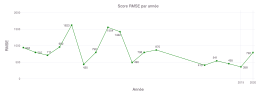

In [511]:
range_annee=sort(unique(dataset5.Année))[begin+1:end]

df = normalize_dataset(copy(dataset5))
y_normalisations = normalize_output(df)

range=sort(unique(df.Année))[begin+1:end]
#range=[2021]
cols=["Année"]
[push!(cols, "$(zone)") for zone in unique(df.Zone)]
resultats = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
resultats.Année .= range
vraies_valeurs = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
vraies_valeurs.Année .= range

rmse_par_année = []
i=1
for année_à_prédire in range
    #print("Année à prédire:", année_à_prédire)
    train = df[df.Année .< année_à_prédire,  :]
    test  = df[df.Année .== année_à_prédire, :]

    y_train = train.Cerfs

    y_test = test.Cerfs;
    trained_models = train_models_by_zone(train, 0., 0.7, y_normalisations)
    #println("entrainement ok")
    ŷ      = predict_by_zone(test, trained_models)
    #println("predict by zone ok")
    ŷ      = retrieve_output(ŷ, test.Zone, y_normalisations)
    #println("retrouve y ok")
    y_test = retrieve_output(y_test, test.Zone, y_normalisations)
    #println("wtf")
    i=1
    #println(test)
    for zone in test.Zone
        #println("Zone:",zone)
        resultats[resultats.Année .== année_à_prédire, "$(zone)"] .= ŷ[i]
        #println("ŷ[i]", ŷ[i])
        vraies_valeurs[resultats.Année .== année_à_prédire, "$(zone)"] .= y_test[i]
        #println("Erreur Zone ", zone," :", ŷ[i]-y_test[i])
        #println("vraies:", y_test[i])
        i+=1
    end
    #println("fini")
    push!(rmse_par_année, rms(y_test, ŷ))
    #print("finito")
end

vraies_valeurs.Année .= range_annee
resultats.Année .= range_annee

println("RMSE moyen : $(mean(rmse_par_année))")
println("RMSE médian : $(median(rmse_par_année))")


set_default_plot_size(26cm, 10cm)
plot(x=range_annee[begin:end-1], y=rmse_par_année[begin:end-1], Geom.line, Geom.point, color=[colorant"green"],
    label=["$(Int64(ceil(rmse)))" for rmse in rmse_par_année[begin:end-1]],
    Geom.label,
    Guide.xlabel("Année"),
    Guide.xticks(ticks=range_annee[end-2:end-1]),
    Guide.ylabel("RMSE"),
    Guide.title("Score RMSE par année"))


On remarque que les RMSE sont plutôt élevés, bien plus que ce qu'on obtiendrait avec un modèle très simple utilisant une seule varaible explicative comme l'année ou le nombre de permis de chasse délivrés. Ceci est sans soute du au fait que, même en enlevant les variables corrélées entre elles, nous avons toujours plus de variables explicatives que de données d'entraînement (d'autant plus qu'on entraine un modèle par zone). Les coefficients de régression permettent alors très bien d'expliquer les données d'entraînement mais ne permettent pas du tout de prédire une nouvelle valeur.

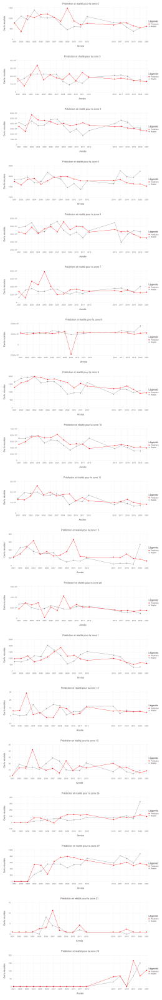

In [512]:
figs = []
for zone in unique(df.Zone)
    push!(figs,
        plot(x=range_annee, y=resultats[!, "$(zone)"], color=[colorant"red"], Geom.line, Geom.point,
            layer(x=range_annee[begin:end-1], y=vraies_valeurs[vraies_valeurs.Année .< range_annee[end], "$(zone)"], Geom.point, Geom.line, color=[colorant"grey"]),
            Guide.xlabel("Année"),
            Guide.ylabel("Cerfs récoltés"),
            Guide.title("Prédiction et réalité pour la zone $(zone)"),
            Guide.manual_color_key("Légende", ["Prédiction", "Réalité"], ["red", "grey"]),
            Guide.xticks(ticks=range_annee)
        )
    )
end
set_default_plot_size(26cm, 160cm)
vstack(figs...)

#### 4.2 Prédiction à partir d'un seul modèle et non d'un modèle par zone

Afin de bénéficier de plus de données d'entrainement, nous avons essayé d'entrainer un seul model commun à toutes les zones. Cela nécessite un encodage one hot des zones à ajouter en tant que variables explicatives. Nous allons utiliser toutes les données antérieures à 2020 et estimer la validité du modèle sur l'année 2020.

In [550]:
df = copy(dataset6)
df_train = df[df.Année.<2020 .&& df.Zone.!=21,:] # on va également enlever la zone 21 car absente de l'année 2020
df_val = df[df.Année.==2020,:]
M = select(df_train, [:Zone => ByRow(isequal(v))=> Symbol(v) for v in unique(df_train.Zone)]);
M2 = select(df_val, [:Zone => ByRow(isequal(v))=> Symbol(v) for v in unique(df_val.Zone)]);
df2 = hcat(df_train, M);
df3 = hcat(df_val, M2);

In [566]:
X_train = Matrix(select(df2, Not(["Zone","Cerfs"]))); # en raison de l'encodage one-hot, on n'a pas besoin d'une colonne remplie de 1
y_train = df2.Cerfs;
#X_train = Matrix(M)
X_val = Matrix(select(df3, Not(["Zone","Cerfs"])));
#X_val = Matrix(M2)
y_val = df3.Cerfs;

In [567]:
β̂ = X_train\y_train;
e = y_train - X_train*β̂
SSE = e'e
println("SSE sur les données d'entrainement: ",SSE)

y_pred = X_val*β̂
RMSE = rms(y_val, y_pred)
println("RMSE sur l'année de validation 2020: ",RMSE)

SSE sur les données d'entrainement: 9.306542477572191e7
RMSE sur l'année de validation 2020: 2141.064727886524


On remarque déjà que le RMSE sur les données de validation est très élevé, ce qui laisse penser qu'un modèle général plutôt qu'un modèle par zone est une mauvaise idée. Il est en réalité même plus élevé qu'un modèle prenant uniquement l'encodage one-hot des zones (qui a un RMSE de 2139.5), les variables explicatives ont des influences différentes selon la zone.

#### 4.3 Analyse approfondie d'un modèle pour une zone donnée
Nous allons ici chercher à construire le meilleur modèle possible pour la zone 2 uniquement. Ceci pourrait nous donner une idée des variables à utiliser par la suite. Aattention tout de même,nous avons constaté en répétant le procédé avec différentes zones que les résultats changaient considérablement.

In [707]:
zone = 2
df = remove_null_variance_columns(dataset6[dataset6.Zone .== zone, :])
#df = df[df.Zone.==1,:]
df_train = df[df.Année.<2020,:] 
df_val = df[df.Année.==2020,:]
y_train = df_train.Cerfs;
y_val = df_val.Cerfs;
n = length(y_train)

z = fill(zone, n)
temp = DataFrame(Zone=z);
df_train = hcat(temp,df_train)
z = fill(zone, 1)
temp = DataFrame(Zone=z);
df_val = hcat(temp,df_val)
variables_a_enlever = ["Zone","Cerfs"]
[push!(variables_a_enlever, v) for v in retirer_variables_correlees_zone(df_train, zone, 0.4)]

X_train = hcat(ones(n), Matrix(select(df_train, Not(variables_a_enlever)))); 
X_val = hcat(ones(1),Matrix(select(df_val, Not(variables_a_enlever))));

In [708]:
β̂ = X_train\y_train;
e = y_train - X_train*β̂
SSE = e'e
println("SSE sur les données d'entrainement: ",SSE)
p = size(X_train, 2) #prend déjà en compte la colonne remplie de zéros
σ̂² = SSE / (n-p)

y_pred = X_val*β̂
RMSE = rms(y_val, y_pred)
println("RMSE sur l'année de validation 2020: ",RMSE)

SSE sur les données d'entrainement: 683491.1647749052
RMSE sur l'année de validation 2020: 39.85105505455488


Analyse des coefficients de régression

In [709]:
using Distributions

In [710]:
# Niveau de confiance
α = .05
v = diag(inv(X_train'X_train))
# Calcul du quantile d'ordre (1-α/2) de la loi de Student à (n-p) degrés de liberté
q = quantile(TDist(n-p), 1-α/2)
# Intervalles de confiance à 95%
se = q * sqrt.(σ̂² * v)
a = round.(β̂ - se, digits=3)
b = round.(β̂ + se, digits=3)

vars = ["intercept"]
[push!(vars, v) for v in names(select(df_train, Not(variables_a_enlever)))]
p = length(vars)
for i in 1:p
    print("β ",vars[i]," = ", β̂[i]," [",a[i]," ",b[i],"]")
    if (a[i]<0 && b[i]>0)
        print("  xxx Beta non significatif xxx")
    end
    print("\n")
end

β intercept = 18535.118544467805 [-80548.285 117618.522]  xxx Beta non significatif xxx
β Année = -8.71497606666811 [-58.375 40.945]  xxx Beta non significatif xxx
β essence_p10 = -6.246850986994421 [-20.647 8.153]  xxx Beta non significatif xxx
β Total = 0.0035685721166331926 [-0.009 0.016]  xxx Beta non significatif xxx
β recolte_Cerfs_année_delta_2 = -0.08470769857640811 [-0.385 0.216]  xxx Beta non significatif xxx


JPP je sais pas pourquoi ça fait cette merde

## 5. Estimation du nombre de cerfs mâles adultes récoltés par zone de chasse en 2021 

On utilise le modèle simple de la section précédente pour estimer le nombre de cerfs récoltés pour chacune des lignes de l'ensemble de test.

#### 5.1 Chargement des données de l'ensemble de test et définition des variables explicatives

In [504]:
test = CSV.read("data/test.csv", DataFrame);

#### 5.2 Préparation du fichier des préditions pour téléverser sur Kaggle

Le fichier *benchmark_predictions.csv* généré peut être téléversé sur Kaggle. Il est composé d'une colonne de zones (Zone) et d'une colonne du nombre de cerfs récoltés (Cerfs).

In [505]:
ŷ=[]
[push!(ŷ, resultats[resultats.Année .== range_annee[end], "$(zone)"][1]) for zone in test.Zone]
prediction = DataFrame(Zone = test.Zone, Cerfs = ŷ)

CSV.write("output_sans_meteo.csv", prediction)
prediction

,Zone,Cerfs
,Int64,Any
1,1,442.145
2,2,295.698
3,3,1127.24
4,4,1931.75
5,5,1643.9
6,6,3428.9
7,7,3026.6
8,8,3612.59
9,9,1027.57


#### 2.2 Quantité de cerfs récoltés annuellement dans les différentes zones de chasse

On doit d'abord additionner le nombre de cerfs récoltés selon les différents engins de chasse.

In [9]:
zones = groupby(recolte, :Zone)  # On groupe les données par zone

new_df = DataFrame(Année = Int64[], Zone = Int64[], Cerfs= Int64[])  # On initialise un DataFrame vide

for zone in zones  # Pour chaque zone de chasse,
    
    # pour chaque année,
    # on additionne le nombre de cerfs récoltés selon les différents engins de chasse
    df = combine(groupby(zone, :Année), :Cerfs => sum => :Cerfs)  
    
    df2 = DataFrame(Année = df.Année, 
                    Zone = fill(unique(zone.Zone)[1], size(df, 1)),
                    Cerfs = df.Cerfs) 
    
    append!(new_df, df2)  # On ajoute l'information au DataFrame préinitialisé 
end

sort!(new_df, :Année)
first(new_df, 5)  

Row,Année,Zone,Cerfs
,Int64,Int64,Int64
1,1999,2,922
2,1999,3,1519
3,1999,4,4890
4,1999,5,2014
5,1999,6,4846


In [10]:
groupby(new_df, :Zone)[1].Zone[1]

1

In [11]:
zones = unique(new_df[!, :Zone])
pp = Plot[]
set_default_plot_size(16cm, 10cm)
for i = 1:length(zones)
    p = plot(groupby(new_df, :Zone)[i], x=:Année, y=:Cerfs, Geom.point, Geom.line, Guide.title("Zone $(groupby(new_df, :Zone)[i].Zone[1])"))
    push!(pp, p)
end

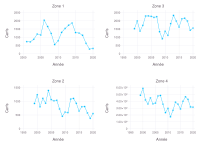

In [12]:
# Pour afficher seulement les 4 premières zones 

p = reshape(pp[1:4], (2,2))

set_default_plot_size(20cm, 15cm)
gridstack(p)

---
## 3. Ajustement d'un modèle de régression linéaire simple

Pour cet exemple simple, on n'utilise que l'année comme variable explicative afin d'ajuster un modèle de régression linéaire pour chaque zone de chasse.

#### 3.1. Ajustement des modèles 

In [13]:
models = DataFrame(Zone = Int64[], β̂₀ = Float64[], β̂₁ = Float64[])  # On initialise le DataFrame vide

zones = groupby(new_df, :Zone)  # On groupe les données par zone
for zone in zones  # Pour chaque zone de chasse,

    y = zone.Cerfs
    n = length(y)
    
    x₁ = zone.Année  # On considère l'année seulement
    
    X = hcat(ones(n), x₁)

    β̂₀, β̂₁ =  X'X\X'y  # Estimation des coefficients de régression
    
    push!(models, [zone.Zone[1], β̂₀, β̂₁])  # On ajoute ça au DataFame
end

models

Row,Zone,β̂₀,β̂₁
,Int64,Float64,Float64
1,1,28245.2,-13.4955
2,2,49648.1,-24.2823
3,3,9345.92,-3.75325
4,4,1.27533e5,-61.5878
5,5,5860.35,-2.00452
6,6,97345.5,-46.1542
7,7,-1.33481e5,67.8012
8,8,-63143.1,32.8329
9,9,78552.2,-38.4269


#### 3.2. Validation graphique

Pour avoir un aperçu de la qualité de la regression, on ajoute la droite de régression.

In [14]:
zones = unique(new_df[!, :Zone])

pp = Plot[]

set_default_plot_size(10cm, 6cm)
for i = 1:length(zones)
    p = plot(groupby(new_df, :Zone)[i], x=:Année, y=:Cerfs, Geom.point, Geom.line, Guide.title("Zone $(groupby(new_df, :Zone)[i].Zone[1])"),
            intercept=[models[i, :β̂₀]], slope=[models[i, :β̂₁]], Geom.abline(style=:dash, color="red"))
    push!(pp, p)
end

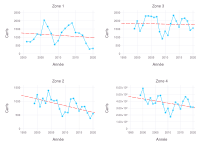

In [15]:
# Pour afficher les 4 premières zones 

p = reshape(pp[1:4], (2,2))

set_default_plot_size(20cm, 15cm)
gridstack(p)

---
## 4. Estimation du nombre de cerfs mâles adultes récoltés par zone de chasse en 2021 

On utilise le modèle simple de la section précédente pour estimer le nombre de cerfs récoltés pour chacune des lignes de l'ensemble de test.

#### 4.1 Chargement des données de l'ensemble de test

In [16]:
test = CSV.read("data/test.csv", DataFrame);

#### 4.2 Estimation du nombre de cerfs récoltés pour chacune des ligne de l'ensemble de test.

In [17]:
models = models[in.(models.Zone, Ref(test.Zone)), :];  # On récupère seulement les modèles pour les zones à prévoir

In [18]:
ŷ = [Int64(ceil(models[i,:].β̂₁ * 2021 + models[i,:].β̂₀)) for i in 1:size(test,1)];

#### 4.3 Préparation du fichier des préditions pour téléverser sur Kaggle

Le fichier *benchmark_predictions.csv* généré peut être téléversé sur Kaggle. Il est composé d'une colonne de zones (Zone) et d'une colonne du nombre de cerfs récoltés (Cerfs).

In [19]:
prediction = DataFrame(Zone = test.Zone, Cerfs = ŷ)

CSV.write("benchmark_predictions.csv", prediction)

"benchmark_predictions.csv"